In [37]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from organograph.mesh.OrganoidMesh import OrganoidMesh
from organograph.mesh.hks import compute_hks
from organograph.plotting.meshes import *

In [ ]:
NOTEBOOK_DIR = Path.cwd().resolve()

MESH_DATA_DIR   = os.path.join(NOTEBOOK_DIR, "..", "..", "NicoleData", "20251201", "fractal_output")

# If you already know the exact mesh file, set it here and skip discovery, otherwise set None
TIMEPOINT  = 'day4p5'  

# WELL   = "B03"
# ORG_ID = "144"

# WELL   = "B02"
# ORG_ID = "124"

# WELL   = "B04"
# ORG_ID = "4"

# WELL   = "B05"
# ORG_ID = "54"

WELL   = "B02"
ORG_ID = "115"

# WELL   = "B02"
# ORG_ID = "100"

# WELL   = "B02"
# ORG_ID = "31"


MESH_PATH = (
    Path(MESH_DATA_DIR)
    / TIMEPOINT
    / "251130R0.zarr"
    / WELL[0]           # "B"
    / WELL[1:]          # "03"
    / "2_zillum_registered"
    / "meshes"
    / "nnorg_corrected_annotated_by_projection"
    / f"{ORG_ID}.vtp"
)

print("MESH_DATA_DIR =", MESH_DATA_DIR)
print("TIMEPOINT     =", TIMEPOINT)
print("MESH_PATH     =", MESH_PATH)

MESH_DATA_DIR = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../../NicoleData/20251201/fractal_output
TIMEPOINT     = day4p5
MESH_PATH     = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/notebooks/../../NicoleData/20251201/fractal_output/day4p5/251130R0.zarr/B/05/2_zillum_registered/meshes/nnorg_corrected_annotated_by_projection/54.vtp


In [39]:
# --- Load + normalize mesh ---
mesh = OrganoidMesh(str(MESH_PATH))
mesh.normalize_inplace() # centers mesh and rescales
mesh._eig_decomp() 

(array([6.02704109e-18, 9.27436349e-03, 4.21989484e-02, 4.28307276e-02,
        5.72620905e-02, 6.12630468e-02, 7.51891814e-02, 9.56195982e-02,
        1.08159310e-01, 1.24677963e-01, 1.41759310e-01, 1.63404095e-01,
        1.71184214e-01, 1.82506644e-01, 1.93386918e-01, 2.02852261e-01,
        2.09284067e-01, 2.32627883e-01, 2.43391777e-01, 2.62659648e-01,
        2.69116384e-01, 2.90414321e-01, 3.06232034e-01, 3.12536131e-01,
        3.32796335e-01, 3.39472372e-01, 3.58858372e-01, 3.64189070e-01,
        3.81935764e-01, 3.97112641e-01, 4.14841177e-01, 4.29483717e-01,
        4.33634706e-01, 4.45312162e-01, 4.55232904e-01, 4.91277560e-01,
        5.01751823e-01, 5.05840128e-01, 5.19628393e-01, 5.35941584e-01,
        5.46787563e-01, 5.63998555e-01, 5.78455258e-01, 5.84241624e-01,
        6.06217655e-01, 6.14823954e-01, 6.26313540e-01, 6.37589036e-01,
        6.53864799e-01, 6.59727218e-01, 6.81175434e-01, 6.88909325e-01,
        7.10182558e-01, 7.28485368e-01, 7.36917240e-01, 7.489131

### Helpers

In [40]:
def _mesh_neighbors_from_faces(mesh):
    """
    Build 1-ring vertex neighbors from triangular faces.
    """
    V = len(mesh.v)
    neigh = [set() for _ in range(V)]
    faces = np.asarray(mesh.f, dtype=np.int64)

    for tri in faces:
        i, j, k = tri
        neigh[i].update([j, k])
        neigh[j].update([i, k])
        neigh[k].update([i, j])

    return [np.fromiter(s, dtype=np.int64) for s in neigh]


def _compute_length_scale(mesh):
    """
    Characteristic organoid size based on total surface area.
    """
    vertex_areas = np.asarray(mesh.vertex_areas(), float)
    return float(np.sqrt(np.sum(vertex_areas)))


def _rescale_times_from_tau(mesh, tau_ref):
    """
    Convert dimensionless reference times tau_ref into mesh times.
    """
    tau_ref = np.asarray(tau_ref, float)
    L_mesh = _compute_length_scale(mesh)
    ts_mesh = tau_ref * (L_mesh ** 2)
    return ts_mesh, L_mesh


def _spatial_zscore(x):
    """
    Robust spatial z-score using median / MAD.
    """
    x = np.asarray(x, float)
    med = np.nanmedian(x)
    mad = np.nanmedian(np.abs(x - med))
    denom = 1.4826 * mad
    if denom <= 0:
        denom = np.nanstd(x)
    if denom <= 0:
        denom = 1.0
    return (x - med) / denom


def _nanmean_neighbors(values, neighbors, n_iter=20):
    """
    Inpaint NaNs by iterative neighbor averaging.
    """
    out = np.asarray(values, float).copy()
    valid = np.isfinite(out)

    for _ in range(n_iter):
        changed = False
        out_new = out.copy()

        for i in range(len(out)):
            if valid[i]:
                continue

            nb = neighbors[i]
            if nb.size == 0:
                continue

            vals = out[nb]
            vals = vals[np.isfinite(vals)]

            if vals.size > 0:
                out_new[i] = np.mean(vals)
                changed = True

        out = out_new
        valid = np.isfinite(out)

        if not changed:
            break

    return out


def _dilate_vertex_mask(mask, neighbors, n_steps=1):
    """
    Expand a boolean vertex mask by repeated 1-ring dilation.
    """
    mask = np.asarray(mask, dtype=bool).copy()

    for _ in range(int(n_steps)):
        new_mask = mask.copy()
        idx = np.flatnonzero(mask)
        for i in idx:
            nb = neighbors[i]
            if nb.size > 0:
                new_mask[nb] = True
        mask = new_mask

    return mask

In [41]:
def _fit_line_prefixes(t, Y):
    """
    Vectorized linear fits for prefixes of the time axis.

    Parameters
    ----------
    t : (T,) array
    Y : (V, T) array

    Returns
    -------
    slopes, intercepts, r2, sse : each of shape (V, T)
        Entry [:, j] uses points t[0:j+1].
        Entries for j < 1 are not meaningful.
    """
    t = np.asarray(t, float)
    Y = np.asarray(Y, float)

    V, T = Y.shape
    n = np.arange(1, T + 1, dtype=float)

    c_t = np.cumsum(t)
    c_t2 = np.cumsum(t**2)

    c_y = np.cumsum(Y, axis=1)
    c_y2 = np.cumsum(Y**2, axis=1)
    c_ty = np.cumsum(Y * t[None, :], axis=1)

    den = n * c_t2 - c_t**2
    den = np.where(np.abs(den) < 1e-15, np.nan, den)

    slopes = (n[None, :] * c_ty - c_t[None, :] * c_y) / den[None, :]
    intercepts = (c_y - slopes * c_t[None, :]) / n[None, :]

    sse = (
        c_y2
        + slopes**2 * c_t2[None, :]
        + n[None, :] * intercepts**2
        + 2.0 * slopes * intercepts * c_t[None, :]
        - 2.0 * slopes * c_ty
        - 2.0 * intercepts * c_y
    )

    mean_y = c_y / n[None, :]
    sst = c_y2 - n[None, :] * mean_y**2
    r2 = 1.0 - sse / np.where(sst > 1e-15, sst, np.nan)
    r2 = np.where(sst <= 1e-15, 1.0, r2)

    return slopes, intercepts, r2, sse


def _fit_line_suffixes(t, Y):
    """
    Vectorized linear fits for suffixes of the time axis.

    Entry [:, j] uses points t[j:].
    """
    t = np.asarray(t, float)
    Y = np.asarray(Y, float)

    t_rev = t[::-1]
    Y_rev = Y[:, ::-1]

    slopes_r, intercepts_r, r2_r, sse_r = _fit_line_prefixes(t_rev, Y_rev)

    slopes = slopes_r[:, ::-1]
    intercepts = intercepts_r[:, ::-1]
    r2 = r2_r[:, ::-1]
    sse = sse_r[:, ::-1]

    return slopes, intercepts, r2, sse


def _choose_early_window(t, Y, min_points=3, r2_drop=0.02, min_r2=0.985):
    """
    Start from the first `min_points` indices and keep extending until the fit
    becomes noticeably worse.

    Returns
    -------
    end_idx : (V,) integer array
        Inclusive end index of the chosen early window.
    slopes, intercepts, r2 : full prefix fit tables
    """
    slopes, intercepts, r2, sse = _fit_line_prefixes(t, Y)
    V, T = Y.shape

    end_idx = np.full(V, min_points - 1, dtype=np.int64)

    for j in range(min_points, T):
        prev = r2[:, j - 1]
        cur = r2[:, j]

        good = np.isfinite(cur) & (cur >= min_r2) & ((prev - cur) <= r2_drop)
        end_idx[good] = j

    return end_idx, slopes, intercepts, r2


def _choose_late_window(
    t,
    Y,
    t_max=10.0,
    min_points=3,
    r2_drop=0.02,
    min_r2=0.985,
):
    """
    Choose the curvature window by:
      1. restricting to t < t_max
      2. starting from the first `min_points` points in that restricted set
      3. adding progressively shorter-time points until fit gets worse

    This is implemented as a suffix fit on the restricted time grid.

    Returns
    -------
    start_idx_global : (V,) integer array
        Start index in the full time array for the chosen late window.
    slopes_local, intercepts_local, r2_local : suffix fit tables on restricted grid
    valid_idx : indices of timepoints used in the late-window search
    """
    valid_idx = np.flatnonzero(t < t_max)
    if valid_idx.size < min_points:
        raise ValueError("Not enough timepoints with t < t_max for late fit")

    t_sub = t[valid_idx]
    Y_sub = Y[:, valid_idx]

    slopes_suf, intercepts_suf, r2_suf, sse_suf = _fit_line_suffixes(t_sub, Y_sub)

    V, Tsub = Y_sub.shape
    max_start = Tsub - min_points
    start_idx_local = np.full(V, max_start, dtype=np.int64)

    for j in range(max_start - 1, -1, -1):
        prev = r2_suf[:, j + 1]
        cur = r2_suf[:, j]

        good = np.isfinite(cur) & (cur >= min_r2) & ((prev - cur) <= r2_drop)
        start_idx_local[good] = j

    start_idx_global = valid_idx[start_idx_local]

    return start_idx_global, slopes_suf, intercepts_suf, r2_suf, valid_idx


def _gather_by_index(arr2d, idx):
    """
    Gather arr2d[i, idx[i]] for each row i.
    """
    idx = np.asarray(idx, dtype=np.int64)
    rows = np.arange(arr2d.shape[0], dtype=np.int64)
    return arr2d[rows, idx]

### core curvature calculation

In [42]:
def compute_gaussian_curvature_from_hks(
    mesh,
    *,
    tau_ref,
    early_min_points=3,
    early_r2_drop=0.02,
    early_min_r2=0.985,
    late_t_max=10.0,
    late_min_points=3,
    late_r2_drop=0.02,
    late_min_r2=0.985,
    defect_zmax=5.0,
    positive_defects_only=True,
    defect_dilation_steps=2,
    inpaint_iters=30,
):
    """
    Estimate Gaussian curvature from HKS using two automatically discovered
    linear regimes in

        y(t) = 4*pi*t*HKS(x,t) - 1

    Early fit:
        starts at the first 3 points and keeps extending until the fit worsens
        -> used for defect detection

    Late fit:
        restricted to times t < late_t_max, starts from the first 3 points in
        that set, then adds progressively shorter times until the fit worsens
        -> used for curvature estimation

    Returns
    -------
    dict with:
      K_A, K_AB, K_ABC
      early_slope, late_slope
      early_end_idx, late_start_idx
      defect_score, defect_mask
      hks_full, y_full, ts_mesh
    """
    V = len(mesh.v)
    ts_mesh, L_mesh = _rescale_times_from_tau(mesh, tau_ref)
    ts_mesh = np.asarray(ts_mesh, float)

    hks_full = np.asarray(compute_hks(mesh, ts_mesh, coeffs=False), float)
    y_full = 4.0 * np.pi * hks_full * ts_mesh[None, :] - 1.0

    # --------------------------------------------------
    # early regime: prefix fits
    # --------------------------------------------------
    early_end_idx, early_slopes_all, early_intercepts_all, early_r2_all = _choose_early_window(
        ts_mesh,
        y_full,
        min_points=early_min_points,
        r2_drop=early_r2_drop,
        min_r2=early_min_r2,
    )

    early_slope = _gather_by_index(early_slopes_all, early_end_idx)
    early_intercept = _gather_by_index(early_intercepts_all, early_end_idx)
    early_r2 = _gather_by_index(early_r2_all, early_end_idx)

    # --------------------------------------------------
    # late regime: suffix fits on times < late_t_max
    # --------------------------------------------------
    late_start_idx, late_slopes_all_sub, late_intercepts_all_sub, late_r2_all_sub, late_valid_idx = _choose_late_window(
        ts_mesh,
        y_full,
        t_max=late_t_max,
        min_points=late_min_points,
        r2_drop=late_r2_drop,
        min_r2=late_min_r2,
    )

    # map chosen global start indices back to local late-subgrid indices
    late_local_map = {g: j for j, g in enumerate(late_valid_idx)}
    late_start_idx_local = np.array([late_local_map[g] for g in late_start_idx], dtype=np.int64)

    late_slope = _gather_by_index(late_slopes_all_sub, late_start_idx_local)
    late_intercept = _gather_by_index(late_intercepts_all_sub, late_start_idx_local)
    late_r2 = _gather_by_index(late_r2_all_sub, late_start_idx_local)

    # curvature estimate from late slope
    K_A = 3.0 * late_slope

    # --------------------------------------------------
    # defect detection from early slope
    # --------------------------------------------------
    defect_score = _spatial_zscore(early_slope)
    defect_mask = defect_score > float(defect_zmax)

    if positive_defects_only:
        defect_mask &= np.isfinite(K_A) & (K_A > 0)

    neighbors = _mesh_neighbors_from_faces(mesh)

    if defect_dilation_steps > 0:
        defect_mask = _dilate_vertex_mask(defect_mask, neighbors, n_steps=defect_dilation_steps)

    # masked and inpainted variants
    K_AB = K_A.copy()
    K_AB[defect_mask] = np.nan

    K_ABC = _nanmean_neighbors(K_AB, neighbors, n_iter=inpaint_iters)

    return {
        "tau_ref": np.asarray(tau_ref, float),
        "ts_mesh": ts_mesh,
        "L_mesh": L_mesh,
        "hks_full": hks_full,
        "y_full": y_full,
        "early_end_idx": early_end_idx,
        "late_start_idx": late_start_idx,
        "early_slope": early_slope,
        "early_intercept": early_intercept,
        "early_r2": early_r2,
        "late_slope": late_slope,
        "late_intercept": late_intercept,
        "late_r2": late_r2,
        "defect_score": defect_score,
        "defect_mask": defect_mask,
        "K_A": K_A,
        "K_AB": K_AB,
        "K_ABC": K_ABC,
    }

### plotting helpers for curvature maps

In [43]:
def plot_curvature_maps(mesh, fit_result):
    fig = plot_organoid_mesh(mesh, fit_result["K_A"], backend="plotly")
    fig.update_layout(title="K_A: late linear fit")
    fig.show()

    fig = plot_organoid_mesh(mesh, fit_result["K_AB"], backend="plotly")
    fig.update_layout(title="K_AB: late fit + defect masking")
    fig.show()

    fig = plot_organoid_mesh(mesh, fit_result["K_ABC"], backend="plotly")
    fig.update_layout(title="K_ABC: late fit + defect masking + inpainting")
    fig.show()


def plot_defect_maps(mesh, fit_result):
    fig = plot_organoid_mesh(mesh, fit_result["defect_score"], backend="plotly", center_at_zero=False)
    fig.update_layout(title="Defect score (from early slope)")
    fig.show()

    fig = plot_organoid_mesh(mesh, fit_result["defect_mask"].astype(float), backend="plotly", center_at_zero=False)
    fig.update_layout(title="Defect mask")
    fig.show()


def plot_slope_maps(mesh, fit_result):
    fig = plot_organoid_mesh(mesh, fit_result["early_slope"], backend="plotly")
    fig.update_layout(title="Early slope")
    fig.show()

    fig = plot_organoid_mesh(mesh, fit_result["late_slope"], backend="plotly")
    fig.update_layout(title="Late slope")
    fig.show()

### plotting helpers for fit diagnostics

In [44]:
def plot_hks_curvature_fit_examples(
    fit_result,
    vertex_ids,
    *,
    show_variant="AB",
    ncols=2,
    fig_width=8,
    row_height=3.0,
):
    """
    Plot y(t) = 4*pi*t*HKS - 1 and the automatically selected early/late fits.
    """
    ts_mesh = fit_result["ts_mesh"]
    y_full = fit_result["y_full"]
    early_end_idx = fit_result["early_end_idx"]
    late_start_idx = fit_result["late_start_idx"]

    vertex_ids = np.asarray(vertex_ids, dtype=np.int64)
    n = len(vertex_ids)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(fig_width, row_height * nrows),
        constrained_layout=True,
        sharex=True,
    )
    axes = np.atleast_1d(axes).ravel()

    for ax, vid in zip(axes, vertex_ids):
        y = y_full[vid]
        ax.plot(ts_mesh, y, "o-", linewidth=1.5, label="data")

        # early fit
        je = int(early_end_idx[vid])
        te = ts_mesh[:je + 1]
        ae = fit_result["early_slope"][vid]
        be = fit_result["early_intercept"][vid]

        if np.isfinite(ae):
            t_dense_e = np.linspace(te.min(), te.max(), 200)
            yhat_e = ae * t_dense_e + be
            ax.plot(
                t_dense_e,
                yhat_e,
                "--",
                linewidth=2.0,
                label=f"early fit, slope={ae:.3g}, end={je}",
            )

        # late fit
        jl = int(late_start_idx[vid])
        tl = ts_mesh[jl:np.sum(ts_mesh < 10.0)] if np.any(ts_mesh < 10.0) else ts_mesh[jl:]

        al = fit_result["late_slope"][vid]
        bl = fit_result["late_intercept"][vid]

        if show_variant == "A":
            K = fit_result["K_A"][vid]
            lab = f"late fit A, K={K:.3g}, start={jl}"
        elif show_variant == "AB":
            K = fit_result["K_AB"][vid]
            lab = f"late fit AB, K={K:.3g}, start={jl}"
        else:
            K = fit_result["K_ABC"][vid]
            lab = f"late fit ABC, K={K:.3g}, start={jl}"

        if np.isfinite(al):
            t_dense_l = np.linspace(ts_mesh[jl], np.max(ts_mesh[ts_mesh < 10.0]), 200)
            yhat_l = al * t_dense_l + bl
            ax.plot(
                t_dense_l,
                yhat_l,
                "-",
                linewidth=2.2,
                label=lab,
            )

        ax.axhline(0, linestyle="--", linewidth=0.8, alpha=0.5)
        ax.set_title(f"vertex {vid}")
        ax.set_ylabel(r"$4\pi t\,\mathrm{HKS}-1$")
        ax.grid(True, linestyle="--", linewidth=0.6, alpha=0.5)
        ax.legend(frameon=False)
        ax.set_ylim(bottom=min(0, np.nanmin(y) * 1.05))

    for ax in axes[n:]:
        ax.axis("off")

    for ax in axes[max(0, len(axes) - ncols):]:
        if ax.has_data():
            ax.set_xlabel("time")

    plt.show()

### plotting helpers for score / distributions

In [45]:
def plot_defect_score_diagnostics(fit_result, bins=50, figsize=(8, 3)):
    score = np.asarray(fit_result["defect_score"], float)
    mask = np.asarray(fit_result["defect_mask"], bool)
    thresh = np.nanmin(score[mask]) if np.any(mask) else np.nan

    fig, axes = plt.subplots(1, 2, figsize=figsize, constrained_layout=True)

    axes[0].hist(score[np.isfinite(score)], bins=bins)
    if np.isfinite(thresh):
        axes[0].axvline(thresh, linestyle="--", linewidth=1.5)
    axes[0].set_xlabel("defect score")
    axes[0].set_ylabel("count")
    axes[0].set_title("Defect score histogram")
    axes[0].set_ylim(bottom=0)
    axes[0].grid(True, linestyle="--", linewidth=0.6, alpha=0.5)

    axes[1].plot(np.sort(score[np.isfinite(score)]), linewidth=1.5)
    if np.isfinite(thresh):
        axes[1].axhline(thresh, linestyle="--", linewidth=1.5)
    axes[1].set_xlabel("sorted vertex index")
    axes[1].set_ylabel("defect score")
    axes[1].set_title(f"flagged: {mask.sum()} / {len(mask)}")
    axes[1].set_ylim(bottom=0)
    axes[1].grid(True, linestyle="--", linewidth=0.6, alpha=0.5)

    plt.show()


def plot_curvature_variant_histograms(fit_result, bins=80, figsize=(10, 3.5)):
    K_A = np.asarray(fit_result["K_A"], float)
    K_AB = np.asarray(fit_result["K_AB"], float)
    K_ABC = np.asarray(fit_result["K_ABC"], float)

    fig, axes = plt.subplots(1, 3, figsize=figsize, constrained_layout=True)

    for ax, K, title in zip(
        axes,
        [K_A, K_AB, K_ABC],
        ["A: late fit", "A+B: masked", "A+B+C: inpainted"],
    ):
        vals = K[np.isfinite(K)]
        if vals.size > 0:
            ax.hist(vals, bins=bins)
        ax.set_title(title)
        ax.set_xlabel("Gaussian curvature")
        ax.set_ylabel("count")
        ax.set_ylim(bottom=0)
        ax.grid(True, linestyle="--", linewidth=0.6, alpha=0.5)

    plt.show()

### run the experiment

In [46]:
tau_ref = np.geomspace(5e-5, 3e-2, 24)

fit_result = compute_gaussian_curvature_from_hks(
    mesh,
    tau_ref=tau_ref,
    early_min_points=3,
    early_r2_drop=0.02,
    early_min_r2=0.985,
    late_t_max=10.0,
    late_min_points=4,
    late_r2_drop=0.1,
    late_min_r2=0.95,
    defect_zmax=5.0,
    positive_defects_only=True,
    defect_dilation_steps=2,
    inpaint_iters=30,
)

ts_mesh      = fit_result["ts_mesh"]
hks_full     = fit_result["hks_full"]
y_full       = fit_result["y_full"]
defect_score = fit_result["defect_score"]
defect_mask  = fit_result["defect_mask"]

early_slope  = fit_result["early_slope"]
late_slope   = fit_result["late_slope"]

K_A   = fit_result["K_A"]
K_AB  = fit_result["K_AB"]
K_ABC = fit_result["K_ABC"]

print("L_mesh:", fit_result["L_mesh"])
print("n defect vertices:", int(defect_mask.sum()))
print("fraction defect vertices:", defect_mask.mean())

L_mesh: 30.348556632681344
n defect vertices: 465
fraction defect vertices: 0.02583189822787623


### plot the results

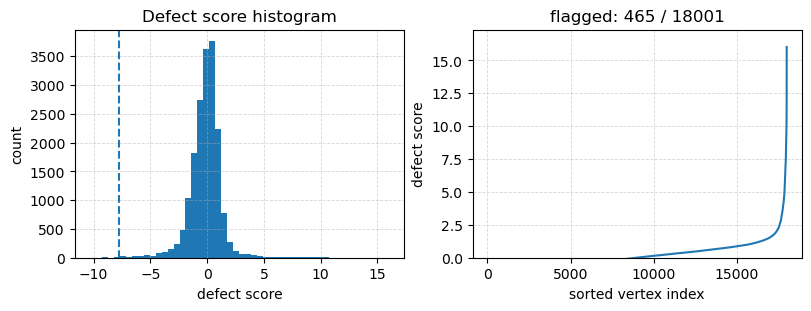

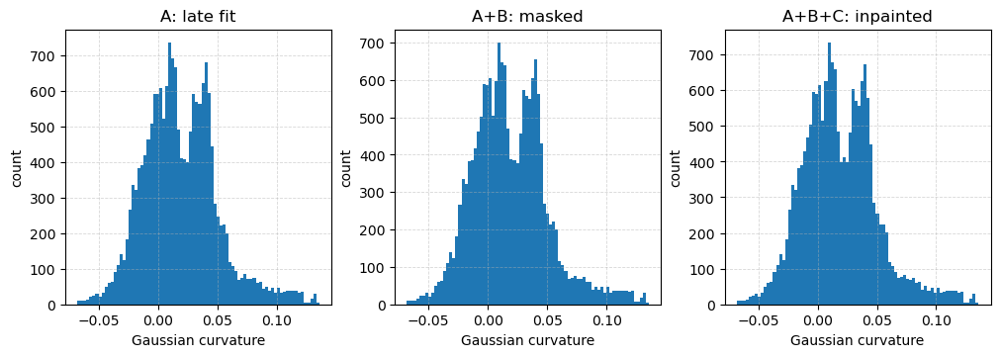

In [47]:
plot_defect_maps(mesh, fit_result)
plot_slope_maps(mesh, fit_result)
plot_curvature_maps(mesh, fit_result)
plot_defect_score_diagnostics(fit_result)
plot_curvature_variant_histograms(fit_result)

### inspect fits at selected vertices

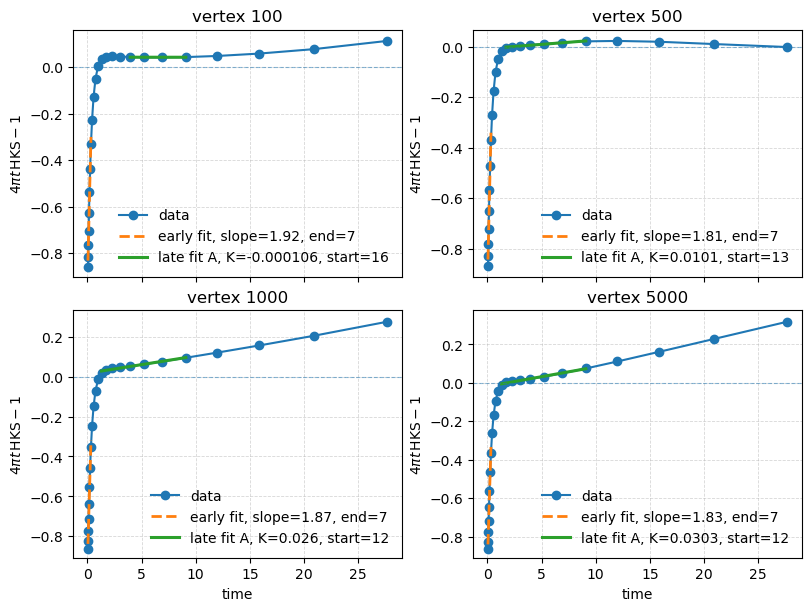

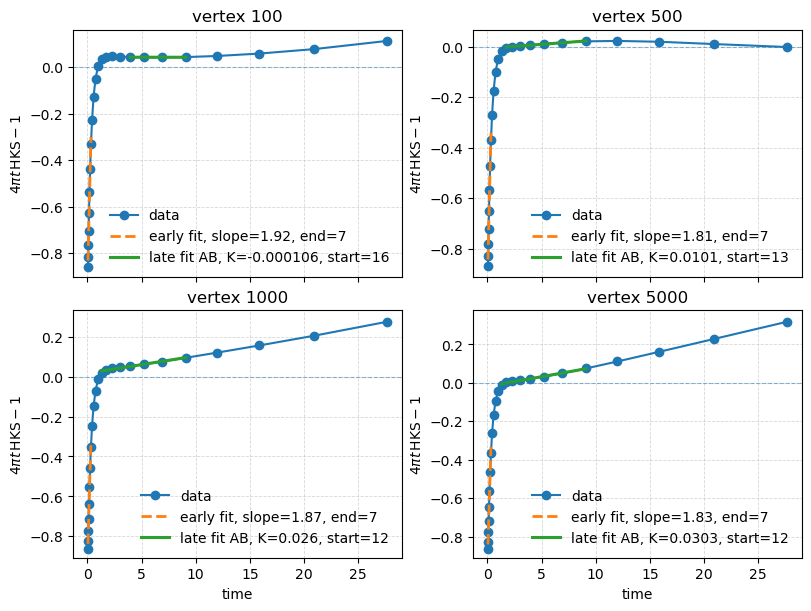

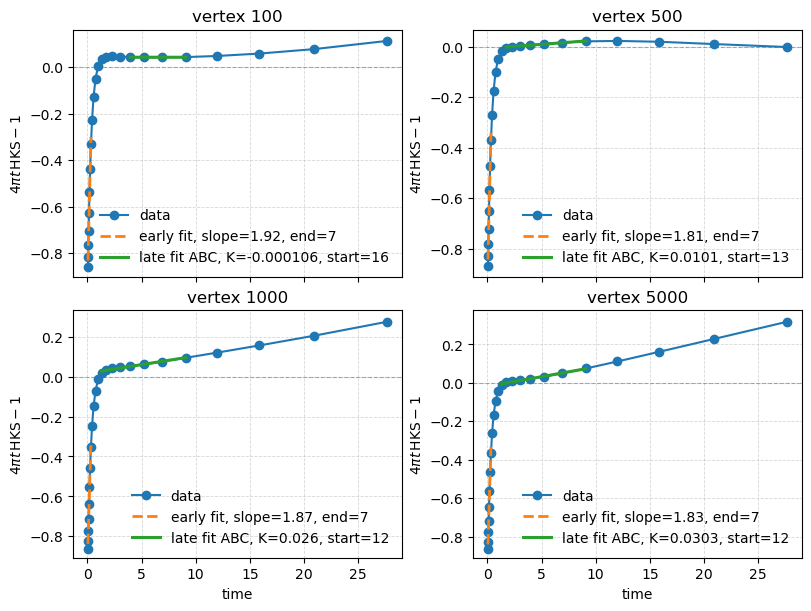

In [48]:
example_vertices = [100, 500, 1000, 5000]

plot_hks_curvature_fit_examples(fit_result, example_vertices, show_variant="A")
plot_hks_curvature_fit_examples(fit_result, example_vertices, show_variant="AB")
plot_hks_curvature_fit_examples(fit_result, example_vertices, show_variant="ABC")

### compare suspicious vs normal regions

In [49]:
# # Example: compare top-scoring defect vertices against low-score vertices.

# score = fit_result["defect_score"]
# idx_sorted = np.argsort(score)

# n_show = 200
# normal_vertices = idx_sorted[:n_show]
# defect_vertices = idx_sorted[-n_show:]

# plot_time_series_summary_for_vertex_sets(
#     fit_result,
#     vertex_sets=[normal_vertices, defect_vertices],
#     labels=["low defect score", "high defect score"],
#     statistic="median",
# )

In [50]:
import numpy as np


def integrate_gaussian_curvature(
    mesh,
    curvature,
    mask=None,
    use_vertex_areas=True,
    from_mass_matrix=True,
    return_details=False,
):
    """
    Integrate a vertex-wise Gaussian curvature field over the mesh surface.

    Parameters
    ----------
    mesh : OrganoidMesh-like object
        Must provide:
          - mesh.v
          - mesh.f
          - mesh.vertex_areas(...)
        and optionally mesh.face_areas() if use_vertex_areas=False.
    curvature : (V,) array_like
        Gaussian curvature values defined at vertices.
    mask : (V,) bool array_like, optional
        If given, only integrate over vertices where mask is True.
        Useful for checking the integral on the "good" region before inpainting.
    use_vertex_areas : bool, default=True
        If True, compute integral as sum_i K_i * A_i using per-vertex areas.
        This is the recommended choice for your curvature field.
        If False, curvature is first averaged to faces and integrated face-wise.
    from_mass_matrix : bool, default=True
        Passed to mesh.vertex_areas(). Set False if you want purely geometric
        barycentric areas and do not want to rely on a precomputed mass matrix.
    return_details : bool, default=False
        If True, also return a dict with useful diagnostics.

    Returns
    -------
    total_curvature : float
        Approximation to ∫ K dA.
    details : dict, optional
        Returned only if return_details=True.
    """
    K = np.asarray(curvature, dtype=float)
    V = len(mesh.v)

    if K.shape != (V,):
        raise ValueError(f"`curvature` must have shape ({V},), got {K.shape}")

    finite = np.isfinite(K)

    if mask is not None:
        mask = np.asarray(mask, dtype=bool)
        if mask.shape != (V,):
            raise ValueError(f"`mask` must have shape ({V},), got {mask.shape}")
        finite &= mask

    if use_vertex_areas:
        # Best choice for a vertex-defined curvature field
        A = np.asarray(mesh.vertex_areas(from_mass_matrix=from_mass_matrix), dtype=float)
        if A.shape != (V,):
            raise ValueError(f"vertex areas must have shape ({V},), got {A.shape}")

        total_curvature = float(np.sum(K[finite] * A[finite]))
        integrated_area = float(np.sum(A[finite]))

    else:
        # Optional face-based integration by averaging vertex curvature to faces
        F = np.asarray(mesh.f, dtype=np.int64)
        face_areas = np.asarray(mesh.face_areas(), dtype=float)

        K_face = np.mean(K[F], axis=1)
        face_valid = np.all(finite[F], axis=1)

        total_curvature = float(np.sum(K_face[face_valid] * face_areas[face_valid]))
        integrated_area = float(np.sum(face_areas[face_valid]))

    if not return_details:
        return total_curvature

    details = {
        "target_sphere": 4.0 * np.pi,
        "error_to_4pi": total_curvature - 4.0 * np.pi,
        "relative_error_to_4pi": (total_curvature - 4.0 * np.pi) / (4.0 * np.pi),
        "estimated_euler_characteristic": total_curvature / (2.0 * np.pi),
        "integrated_area": integrated_area,
        "n_vertices_total": V,
        "n_vertices_used": int(np.sum(finite)),
    }
    return total_curvature, details

In [51]:
total_K, info = integrate_gaussian_curvature(
    mesh,
    fit_result["K_ABC"],
    return_details=True,
)

print("∫ K dA =", total_K)
print("4π      =", info["target_sphere"])
print("error   =", info["error_to_4pi"])
print("χ_est   =", info["estimated_euler_characteristic"])

plot_organoid_mesh(mesh, fit_result["K_ABC"], backend="plotly")


∫ K dA = 17.599398320557775
4π      = 12.566370614359172
error   = 5.033027706198602
χ_est   = 2.801031238159971


In [52]:
from organograph.mesh.curvature import compute_gaussian_curvature_fixed_time


K_fixed, dbg = compute_gaussian_curvature_fixed_time(mesh, return_debug=True, c_h2=(20.0, 30.0, 40.0))

print("h_mean  =", dbg["h_mean"])
print("ts_fixed =", dbg["ts_fixed"])
print("min/max K candidate =", np.nanmin(dbg["K_candidates"]), np.nanmax(dbg["K_candidates"]))

fixed_idx = dbg["fixed_idx"]
y_fixed = dbg["fit_signal"][:, fixed_idx]

print("min y_fixed:", np.nanmin(y_fixed))
print("max y_fixed:", np.nanmax(y_fixed))
print("mean y_fixed:", np.nanmean(y_fixed))

total_K, info = integrate_gaussian_curvature(
    mesh,
    K_fixed,
    return_details=True,
)

print("∫ K dA =", total_K)
print("4π      =", info["target_sphere"])
print("error   =", info["error_to_4pi"])
print("χ_est   =", info["estimated_euler_characteristic"])

plot_organoid_mesh(mesh, K_fixed, backend="plotly")


h_mean  = 0.27120249341027325
ts_fixed = [1.47101585 2.20652377 2.9420317 ]
min/max K candidate = -0.6014592553756833 0.21577091000179208
min y_fixed: -0.31298540589670665
max y_fixed: 0.171225125937702
mean y_fixed: 0.008344399190577606
∫ K dA = 14.760480318915313
4π      = 12.566370614359172
error   = 2.1941097045561406
χ_est   = 2.349203405166008


In [53]:
from organograph.mesh.curvature import compute_gaussian_curvature_adaptive
        

K_adapt = compute_gaussian_curvature_adaptive(
    mesh,
    threshold_factor=1.02,
)

total_K, info = integrate_gaussian_curvature(
    mesh,
    K_adapt,
    return_details=True,
)

print("∫ K dA =", total_K)
print("4π      =", info["target_sphere"])
print("error   =", info["error_to_4pi"])
print("χ_est   =", info["estimated_euler_characteristic"])

plot_organoid_mesh(mesh, K_adapt, backend="plotly")

∫ K dA = 12.566370614359172
4π      = 12.566370614359172
error   = 0.0
χ_est   = 2.0


In [54]:
from organograph.mesh.curvature import compute_gaussian_curvature_smoothed_hks
        

K_smooth, dbg = compute_gaussian_curvature_smoothed_hks(
    mesh,
    t_smooth=(2.0, 2.5, 3.0),
    defect_positive_gate="fit",
    return_debug=True,
    defect_dilation_steps=3,
)

plot_defect_maps(mesh, dbg)

total_K, info = integrate_gaussian_curvature(
    mesh,
    K_smooth,
    return_details=True,
)

print("∫ K dA =", total_K)
print("4π      =", info["target_sphere"])
print("error   =", info["error_to_4pi"])
print("χ_est   =", info["estimated_euler_characteristic"])

plot_organoid_mesh(mesh, K_smooth, backend="plotly")

∫ K dA = 12.566370614359172
4π      = 12.566370614359172
error   = 0.0
χ_est   = 2.0
